## Generate Images from Matlab Files

In [2]:
### sys and glob are useful tools for dealing with the local filesystem.
import glob
import sys

### numpy and matplotlib are the core analysis packages for manipulating and plotting data arrays
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import cv2
import math
import pyproj
from PIL import Image
import json

### NDH_Tools handles conversion of the icesheet data into to depth or elevation adjusted images
import NDH_Tools as ndh

In [3]:
folder = 'UserStudy' #'COLDEX_Unconformity_Fence' #'NE_GREENLAND' # 'COLDEX_Unconformity_Fence' #

In [9]:
### Get the paths to the matlab files
image_folder = folder+'/radar_images/' # location to put the images
data_folder = folder+'/matlab_files/' # location to get the matlab files
fns = glob.glob(data_folder+'*.mat')#sorted(glob.glob(data_folder+'Data_'+dateframe+'.mat'))
fns

['UserStudy/matlab_files\\Line_007.mat',
 'UserStudy/matlab_files\\Line_008.mat',
 'UserStudy/matlab_files\\Line_009.mat',
 'UserStudy/matlab_files\\Line_010.mat',
 'UserStudy/matlab_files\\Line_011.mat',
 'UserStudy/matlab_files\\Line_012.mat',
 'UserStudy/matlab_files\\Line_013.mat',
 'UserStudy/matlab_files\\Line_014.mat',
 'UserStudy/matlab_files\\Line_015.mat',
 'UserStudy/matlab_files\\Line_016.mat',
 'UserStudy/matlab_files\\Line_017.mat',
 'UserStudy/matlab_files\\Line_018.mat',
 'UserStudy/matlab_files\\Line_019.mat',
 'UserStudy/matlab_files\\Line_020.mat',
 'UserStudy/matlab_files\\Line_021.mat',
 'UserStudy/matlab_files\\Line_022.mat',
 'UserStudy/matlab_files\\Line_023.mat',
 'UserStudy/matlab_files\\Line_024.mat',
 'UserStudy/matlab_files\\Line_025.mat',
 'UserStudy/matlab_files\\Line_026.mat',
 'UserStudy/matlab_files\\Line_027.mat',
 'UserStudy/matlab_files\\Line_028.mat',
 'UserStudy/matlab_files\\Line_029.mat',
 'UserStudy/matlab_files\\Line_030.mat',
 'UserStudy/matl

In [10]:
### Isolate the name of the file for exporting to a json
file_name = []
for file in fns:
    file_name.append(file[len(data_folder):-4]) # -4 to get rid of the '.mat' extention
file_name

['Line_007',
 'Line_008',
 'Line_009',
 'Line_010',
 'Line_011',
 'Line_012',
 'Line_013',
 'Line_014',
 'Line_015',
 'Line_016',
 'Line_017',
 'Line_018',
 'Line_019',
 'Line_020',
 'Line_021',
 'Line_022',
 'Line_023',
 'Line_024',
 'Line_025',
 'Line_026',
 'Line_027',
 'Line_028',
 'Line_029',
 'Line_030',
 'Line_031',
 'Line_032',
 'Line_040',
 'Line_041',
 'Line_042',
 'Line_043',
 'Line_044',
 'Line_045',
 'Line_046',
 'Line_047']

In [11]:
def flip_data(radar_data):
    # Check shapes
    if radar_data['Time'].shape[1] > radar_data['Time'].shape[0]:
        # print("reshaping Time")
        a,b = radar_data['Time'].shape[1], radar_data['Time'].shape[0]
        radar_data['Time'] = radar_data['Time'].reshape(a,b)
#     print(depthdata['depth_axis'][0])
    # print(radar_data['Time'].shape)
    if radar_data['Elevation'].shape[1] < radar_data['Elevation'].shape[0]:
        # print("reshaping Elevation")
        a,b = radar_data['Elevation'].shape[1], radar_data['Elevation'].shape[0]
        radar_data['Elevation'] = radar_data['Elevation'].reshape(a,b)
    
    if radar_data['Bottom'].shape[1] < radar_data['Bottom'].shape[0]:
        # print("reshaping Bottom")
        a,b = radar_data['Bottom'].shape[1], radar_data['Bottom'].shape[0]
        radar_data['Bottom'] = radar_data['Bottom'].reshape(a,b)

    if radar_data['Surface'].shape[1] < radar_data['Surface'].shape[0]:
        # print("reshaping Surface")
        a,b = radar_data['Surface'].shape[1], radar_data['Surface'].shape[0]
        radar_data['Surface'] = radar_data['Surface'].reshape(a,b)

    if radar_data['Latitude'].shape[1] < radar_data['Latitude'].shape[0]:
        # print("reshaping Latitude")
        a,b = radar_data['Latitude'].shape[1], radar_data['Latitude'].shape[0]
        radar_data['Latitude'] = radar_data['Latitude'].reshape(a,b)

    if radar_data['Longitude'].shape[1] < radar_data['Longitude'].shape[0]:
        # print("reshaping Longitude")
        a,b = radar_data['Longitude'].shape[1], radar_data['Longitude'].shape[0]
        radar_data['Longitude'] = radar_data['Longitude'].reshape(a,b)

    return radar_data

    

In [ ]:
# Generate the plain plots with no modifications 
num_files = len(file_name)
start_lon = np.zeros(num_files)
end_lon=np.zeros(num_files)
start_lat=np.zeros(num_files)
end_lat=np.zeros(num_files)

x = np.zeros(num_files, dtype=float)
xo = np.zeros(num_files, dtype=float)
y = np.zeros(num_files, dtype=float)
yo = np.zeros(num_files, dtype=float)

max_elevation = -5000
df_num = 0
#print(fns)
#print(dataframe)
for fn in fns:
    radar_data = ndh.loadmat(fn)
    #print(fn)
    # print(radar_data['Surface'].shape)
    # print(radar_data['Time'].shape)
    # print(radar_data['Bottom'].shape)
    # print(radar_data['Latitude'].shape, radar_data['Longitude'].shape)
    radar_data = flip_data(radar_data)
    
    xy = ndh.polarstereo_fwd(radar_data['Latitude'][0],radar_data['Longitude'][0])
    start_lon[df_num] = radar_data['Longitude'][0][0]
    end_lon[df_num]   = radar_data['Longitude'][0][-1]
    start_lat[df_num] = radar_data['Latitude'][0][0]
    end_lat[df_num]   = radar_data['Latitude'][0][-1]
    
    x[df_num] = xy['x'][-1]
    xo[df_num] = xy['x'][0]
    y[df_num] = xy['y'][-1]
    yo[df_num] = xy['y'][0]
    
    #print(type(xy['x'][0]),type( radar_data['Longitude'][0][0]), type(x[df_num]),xy['x'][-1],xy['y'])
    distance = ndh.distance_vector(xy['x'],xy['y'])
    #print(distance[0], distance[-1])
    depthdata = ndh.elevation_shift(radar_data['Data'],radar_data['Time'],radar_data['Surface'][0],radar_data['Elevation'][0],radar_data['Bottom'][0])

    # Get the max elevation
    # print(depthdata['depth_axis'][0],depthdata['depth_axis'][-1],'\n')
    if depthdata['depth_axis'][0] > max_elevation:
        max_elevation = depthdata['depth_axis'][0]

    #print(depthdata)
    fig = plt.figure(figsize=(10,7))
    #plt.tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
    #plt.axis('off') 

    # imdata = plt.imshow(np.log10(depthdata['new_data']**2),extent=[distance[0]/1000,distance[-1]/1000,depthdata['depth_axis'][0],depthdata['depth_axis'][-1]],origin='lower',aspect='auto',cmap='gray')
    ax = plt.gca()
    ax.invert_yaxis()
    #plt.axhline(y=0)
    #fig.colorbar(imdata)
    
    #plt.savefig(folder+"plots/" +file_name[df_num]+ '.png', transparent=True, pad_inches=0, bbox_inches='tight')
    df_num = df_num+1

#print(xo,'\n', x,'\n', y,'\n', yo)

In [18]:
### Calcualte the xy corrd and the equations for the lines


## Get the lat-lon to x-y cooridinates trnasform set up
# Input corrdinates - lat lon
projIn = pyproj.Proj(init='epsg:4326')

# Output corrodinates - x, y wrt North Pole
projOut = pyproj.Proj(init='epsg:3413')

xo,yo = pyproj.transform(projIn, projOut, start_lon, start_lat)
x,y = pyproj.transform(projIn, projOut, end_lon, end_lat)

# calculate the equations for the line
m,b  = np.zeros(num_files), np.zeros(num_files)
for i in range(num_files):
    m[i] = (max(yo[i],y[i]) - min(yo[i],y[i]))/(max(xo[i],x[i]) - min(xo[i],x[i]))
    b[i] = yo[i] - m[i]* xo[i]

# Create the dictionary to write the file data to
img_dic = {}

img_dic["global_data"]= {   
    'y_closest_to_zero': min(min(yo, key=lambda x:abs(x-0)), min(y, key=lambda x:abs(x-0)))/1000,
    'x_closest_to_zero': min(min(xo, key=lambda x:abs(x-0)), min(x, key=lambda x:abs(x-0)))/1000 
}

for i in range(num_files):
    img_dic[str(file_name[i])] = {'id': str(file_name[i]), 'm': m[i], 'b':b[i], 'xo': xo[i]/1000, 'yo': yo[i]/1000, 'x':x[i]/1000, 'y':y[i]/1000,
                                 'xmid': (xo[i]+x[i])/2/1000, 'ymid': (yo[i]+y[i])/2/1000, 'deltax': (xo[i]-x[i])/1000, 'deltay': (yo[i]-y[i])/1000}
    
#print(img_dic)

with open(folder+'/'+folder+'.json', 'w') as f:
    json.dump(img_dic, f)

## The follwing cells produce images which can be used for debugging

In [7]:
# Should be in the above cell now 

# ## Shows the range of depths to determin better elevation to crop to
# max_elevation = -5000
# for fn in fns:
#     radar_data = ndh.loadmat(fn)
    
#     xy = ndh.polarstereo_fwd(radar_data['Latitude'][0],radar_data['Longitude'][0])
#     distance = ndh.distance_vector(xy['x'],xy['y'])
    
#     depthdata = ndh.elevation_shift(radar_data['Data'],radar_data['Time'],radar_data['Surface'][0],radar_data['Elevation'][0],radar_data['Bottom'][0])
#     print(depthdata['depth_axis'][0],depthdata['depth_axis'][-1],'\n')
#     if depthdata['depth_axis'][0] > max_elevation:
#         max_elevation = depthdata['depth_axis'][0]
#     #print(distance[0],distance[-1])

In [20]:
max_elevation

2493.1751419007032

In [ ]:
# 0elevation

# Produce graphs with a line at the 0 elevation mark - to save uncomment plt.savefig() line
# Images marked with the _0elevation tag

df_num = 0
for fn in fns:
    radar_data = ndh.loadmat(fn)
    # Check shapes and correct if needed
    radar_data = flip_data(radar_data)
    
    xy = ndh.polarstereo_fwd(radar_data['Latitude'][0],radar_data['Longitude'][0])
    distance = ndh.distance_vector(xy['x'],xy['y'])
    
    depthdata = ndh.elevation_shift(radar_data['Data'],radar_data['Time'],radar_data['Surface'][0],radar_data['Elevation'][0],radar_data['Bottom'][0])
    print(depthdata['depth_axis'].shape, distance.shape) #depthdata['depth_axis'][0])#,depthdata['depth_axis'][-1], 
    print(distance[0],distance[-1])
    #i=0
    #while(depthdata['depth_axis'][i] > 1000): i = i+1
    #print("Closest values to 1000: ", depthdata['depth_axis'][i], i, depthdata['depth_axis'][i-1])
    
    #j = -360
    #while(depthdata['depth_axis'][j] < -1000): j = j-1
    #print("Closest values to -1000: ",depthdata['depth_axis'][j], j)
    
    k = 0
    while(depthdata['depth_axis'][k] > 0): k=k+1
    print("Closest values to 0: ",depthdata['depth_axis'][k], k, depthdata['depth_axis'][k-1])
    
    #print("The elevation is: ", depthdata['depth_axis'][0]-depthdata['depth_axis'][-1], '\n')
    
    fig = plt.figure(figsize=(10,7))
    #plt.tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
    #plt.axis('off') 

    imdata = plt.imshow(np.log10(depthdata['new_data']**2),extent=[distance[0]/1000,distance[-1]/1000,depthdata['depth_axis'][0],depthdata['depth_axis'][-1]],origin='lower',aspect='auto',cmap='gray')
    ax = plt.gca()
    ax.invert_yaxis()
    plt.axhline(y=0)
    fig.colorbar(imdata)
    
    #plt.savefig(image_folder +file_name[df_num]+ '_zero_elevation.png', transparent=True, pad_inches=0, bbox_inches='tight')    
    df_num = df_num+1

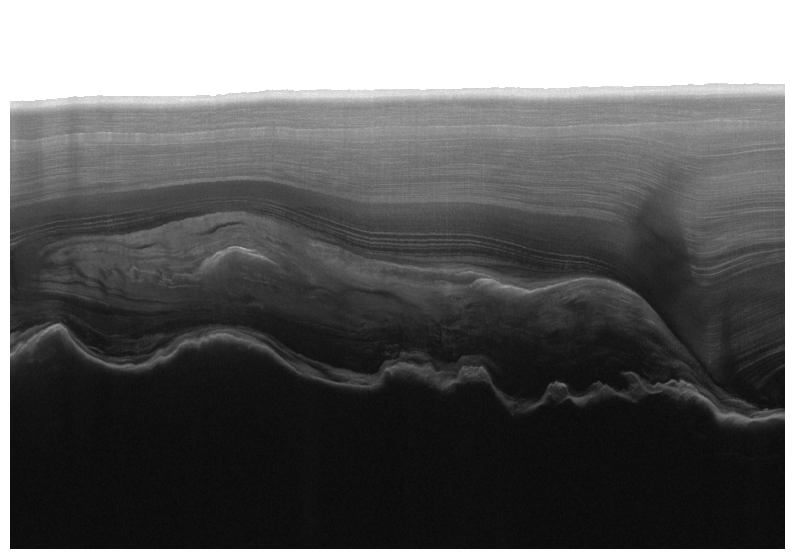

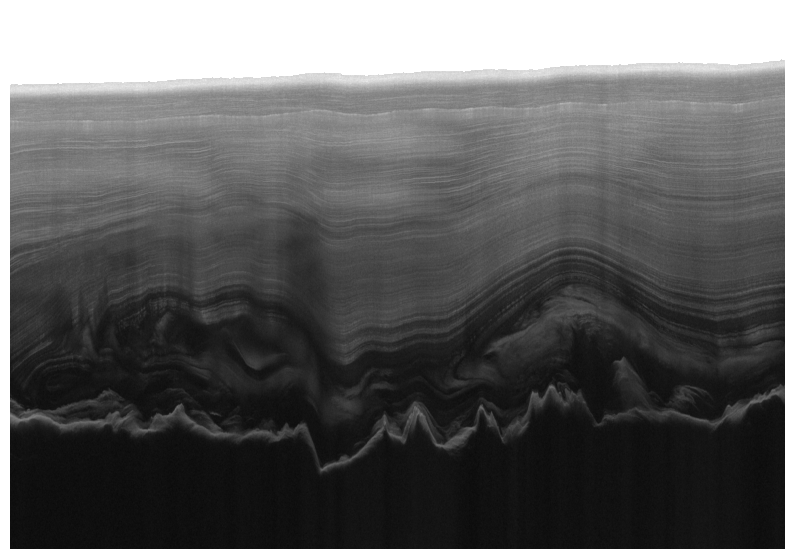

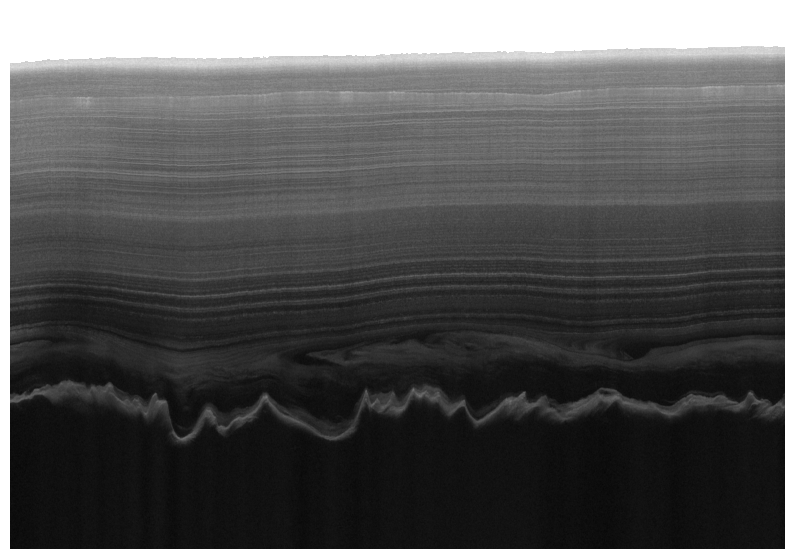

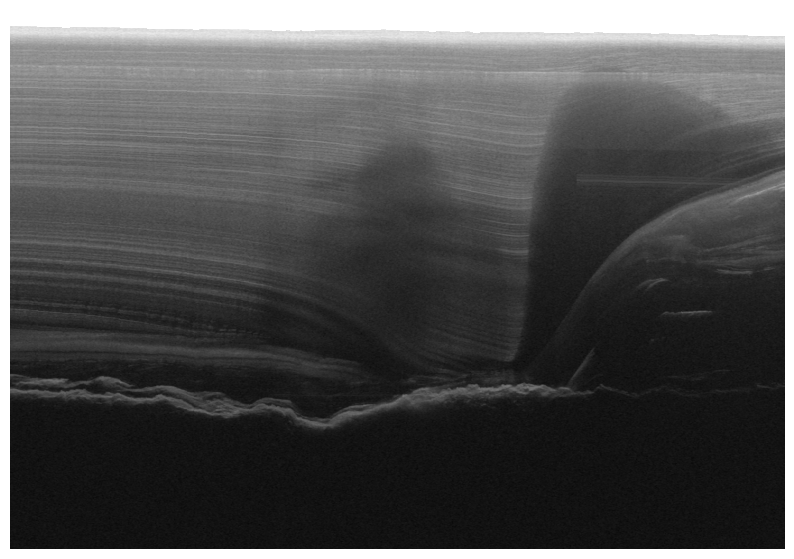

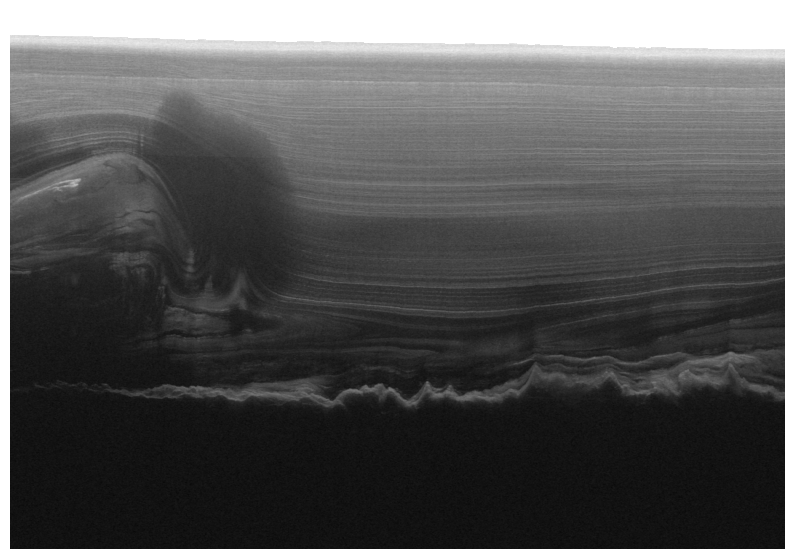

...

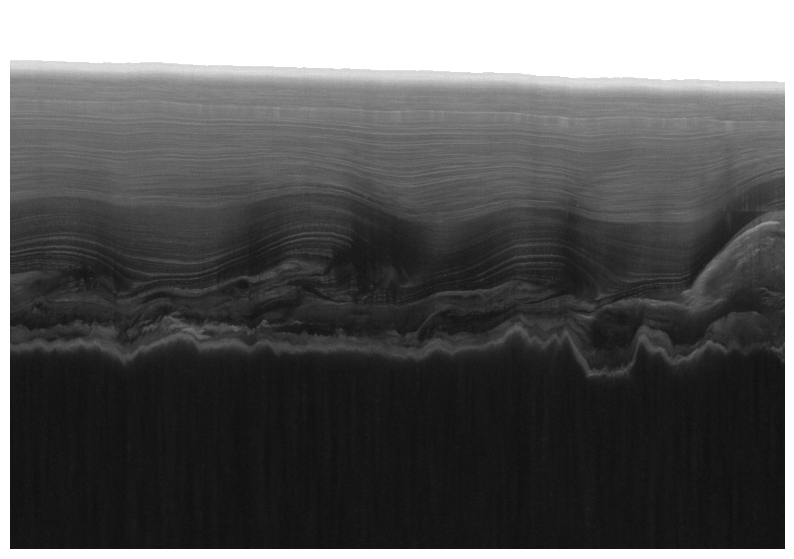

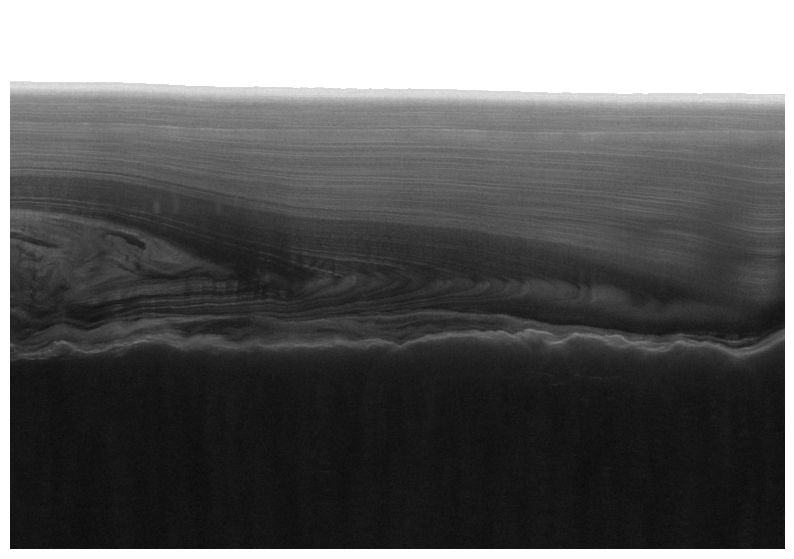

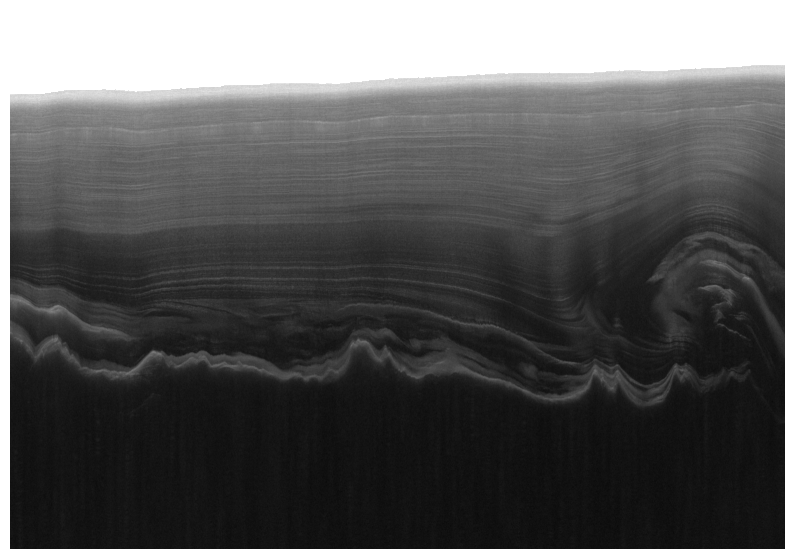

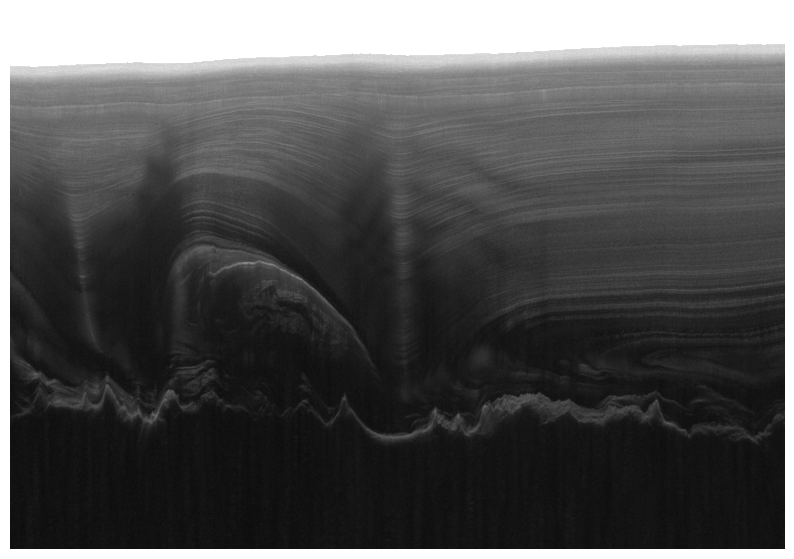

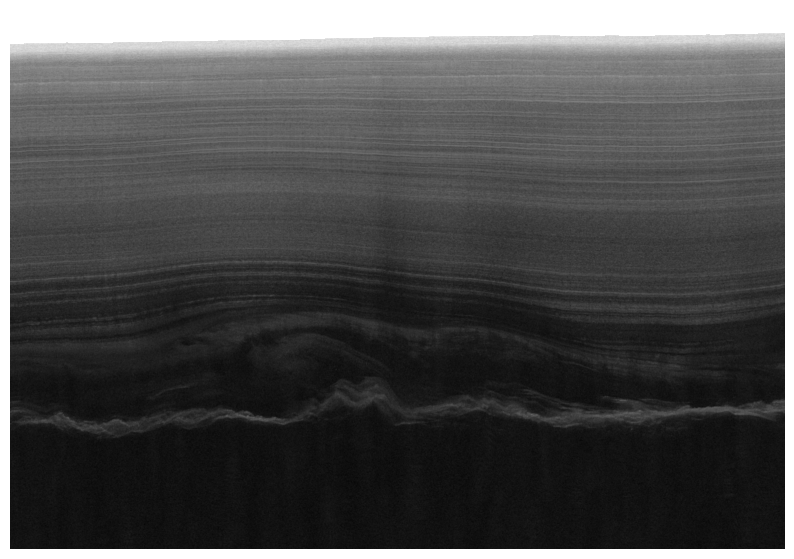

In [14]:
# adjusted

# Create the images with the same elevation range max to -2000 - to save uncomment plt.savefig() line
# Images marked with the _adjusted tag

df_num = 0
for fn in fns:
    radar_data = ndh.loadmat(fn)
    
    # Check shapes and correct if needed
    radar_data = flip_data(radar_data)
    
    xy = ndh.polarstereo_fwd(radar_data['Latitude'][0],radar_data['Longitude'][0])
    distance = ndh.distance_vector(xy['x'],xy['y'])
      
    depthdata = ndh.elevation_shift(radar_data['Data'],radar_data['Time'],radar_data['Surface'][0],radar_data['Elevation'][0],radar_data['Bottom'][0])
    #print("Depth len: ",depthdata['depth_axis'].shape, "Data dim: ", depthdata['new_data'].shape)
    
    i=0
    if(depthdata['depth_axis'][i] < max_elevation):
        # get teh difference and calculate the elevation added
        dif = depthdata['depth_axis'][i] - depthdata['depth_axis'][i+1]
        add_rows = math.floor((max_elevation - depthdata['depth_axis'][i])/dif)
        new_rows = np.zeros((add_rows, distance.shape[0]),dtype='int') 
        # add the new rows into the data
        depthdata['new_data'] = np.vstack((new_rows,depthdata['new_data']))
        # add to the depth to ensure that the numbers match up
        add_depth = np.arange(depthdata['depth_axis'][0]+dif, max_elevation, dif)
        depthdata['depth_axis'] = np.append(add_depth, depthdata['depth_axis'])
    # this else should run at least once since the one image which determined the max shouldn't be caught above - through it maybe bc double math
    else: 
        while(depthdata['depth_axis'][i] > max_elevation): i = i+1
    
    #print("New Depth len: ",depthdata['depth_axis'].shape, "New Data dim: ", depthdata['new_data'].shape, '\n')
    #print("DepthData[newdata]: ", depthdata['new_data'].shape)
    
    j = -1
    while(depthdata['depth_axis'][j] < -1000): j = j-1
    #print("Closest values to -2000: ",depthdata['depth_axis'][j], j,depthdata['depth_axis'][j].shape)
    
        
    fig = plt.figure(figsize=(10,7))
    plt.axis('off') 
    
    imdata = plt.imshow(np.log10(depthdata['new_data']**2)[i:j,:],extent=[distance[0]/1000,distance[-1]/1000,depthdata['depth_axis'][i],depthdata['depth_axis'][j]],origin='lower',aspect='auto',cmap='gray')
    ax = plt.gca()
    ax.invert_yaxis()
    
    plt.savefig(image_folder +file_name[df_num]+ '_adjusted.png', transparent=True, pad_inches=0, bbox_inches='tight')
    df_num = df_num+1

In [15]:
# adjusted_flipped

# Flip the images above and save with the _adjusted_flipped tag

images_to_flip = glob.glob(image_folder+ "*_adjusted.png")

for im in images_to_flip:
    print(im[:-4])

    # open the original image
    original_img = Image.open(im)
    
    
    # Flip the original image horizontally
    horz_img = original_img.transpose(method=Image.FLIP_LEFT_RIGHT)
    horz_img.save(im[:-4]+"_flipped.png")
    
    # close all our files object
    original_img.close()
    horz_img.close()

UserStudy/radar_images\Line_007_adjusted
UserStudy/radar_images\Line_008_adjusted
UserStudy/radar_images\Line_009_adjusted
UserStudy/radar_images\Line_010_adjusted
UserStudy/radar_images\Line_011_adjusted
UserStudy/radar_images\Line_012_adjusted
UserStudy/radar_images\Line_013_adjusted
UserStudy/radar_images\Line_014_adjusted
UserStudy/radar_images\Line_015_adjusted
UserStudy/radar_images\Line_016_adjusted
UserStudy/radar_images\Line_017_adjusted
UserStudy/radar_images\Line_018_adjusted
UserStudy/radar_images\Line_019_adjusted
UserStudy/radar_images\Line_020_adjusted
UserStudy/radar_images\Line_021_adjusted
UserStudy/radar_images\Line_022_adjusted
UserStudy/radar_images\Line_023_adjusted
UserStudy/radar_images\Line_024_adjusted
UserStudy/radar_images\Line_025_adjusted
UserStudy/radar_images\Line_026_adjusted
UserStudy/radar_images\Line_027_adjusted
UserStudy/radar_images\Line_028_adjusted
UserStudy/radar_images\Line_029_adjusted
UserStudy/radar_images\Line_030_adjusted
UserStudy/radar_

In [13]:
# This is taking forever for some reason and the image manip above is better - less processing.


# Create the images with the same elevation range max to -2000 - to save uncomment plt.savefig() line
# Images shoudl all be W to E and N to S - if want [East to West and South to North] - switch to >
# Images marked with the _adjusted_flipped tag

# df_num = 0
# for fn in fns:
#     radar_data = ndh.loadmat(fn)
    
#     # Check shapes and correct if needed
#     radar_data = flip_data(radar_data)
    
#     xy = ndh.polarstereo_fwd(radar_data['Latitude'][0],radar_data['Longitude'][0])
#     distance = ndh.distance_vector(xy['x'],xy['y'])
    
    
#     depthdata = ndh.elevation_shift(radar_data['Data'],radar_data['Time'],radar_data['Surface'][0],radar_data['Elevation'][0],radar_data['Bottom'][0])
#     #print("Depth len: ",depthdata['depth_axis'].shape, "Data dim: ", depthdata['new_data'].shape)
    
#     i=0
#     if(depthdata['depth_axis'][i] < max_elevation):
#         # get teh difference and calculate the elevation added
#         dif = depthdata['depth_axis'][i] - depthdata['depth_axis'][i+1]
#         add_rows = math.floor((max_elevation - depthdata['depth_axis'][i])/dif)
#         new_rows = np.zeros((add_rows, distance.shape[0]),dtype='int') 
#         # add the new rows into the data
#         depthdata['new_data'] = np.vstack((new_rows,depthdata['new_data']))
#         # add to the depth to ensure that the numbers match up
#         add_depth = np.arange(depthdata['depth_axis'][0]+dif, max_elevation, dif)
#         depthdata['depth_axis'] = np.append(add_depth, depthdata['depth_axis'])
#     # this else should run at least once since the one image which determined the max shouldn't be caught above - through it maybe bc double math
#     else: 
#         while(depthdata['depth_axis'][i] > max_elevation): i = i+1
    
#     #print("New Depth len: ",depthdata['depth_axis'].shape, "New Data dim: ", depthdata['new_data'].shape, '\n')
#     #print("DepthData[newdata]: ", depthdata['new_data'].shape)
    
#     j = -1
#     while(depthdata['depth_axis'][j] < -1000): j = j-1
#     #print("Closest values to -2000: ",depthdata['depth_axis'][j], j,depthdata['depth_axis'][j].shape)
    
        
# #     fig = plt.figure(figsize=(10,7))
# #     plt.axis('off') 
    
#     imdata = plt.imshow(np.log10(depthdata['new_data']**2)[i:j,:],extent=[distance[0]/1000,distance[-1]/1000,depthdata['depth_axis'][i],depthdata['depth_axis'][j]],origin='lower',aspect='auto',cmap='gray')
#     ax = plt.gca()
#     ax.invert_yaxis()
#     # calculate the deltax and delta y
#     dx = xy['x'][-1] - xy['x'][0]
#     dy = xy['y'][-1] - xy['y'][0]
#     # if((dy/dx > 0 and xy['x'][-1] < xy['x'][0]) or (dy/dx < 0 and xy['x'][-1] < xy['x'][0])):
#     # Allways flip
#     # if(True): 
#     ax.invert_xaxis()
#     # print('x', xy['x'][-1], xy['x'][0])
#     # print('y', xy['y'][-1], xy['y'][0], '\n')
#     plt.savefig(image_folder +file_name[df_num]+ '_adjusted_flipped.png', transparent=True, pad_inches=0, bbox_inches='tight')
#     df_num = df_num+1

In [14]:
image_folder

'UserStudy/radar_images/'